In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install mmcv-full -f https://download.openmmlab.com/mmcv/dist/cu111/torch1.10.0/index.html
!git clone https://github.com/open-mmlab/mmsegmentation.git

Looking in links: https://download.openmmlab.com/mmcv/dist/cu111/torch1.10.0/index.html
     |████████████████████████████████| 46.6 MB 11.3 MB/s 
     |████████████████████████████████| 190 kB 31.8 MB/s 
Cloning into 'mmsegmentation'...
remote: Enumerating objects: 7020, done.
remote: Counting objects: 100% (32/32), done.
remote: Compressing objects: 100% (26/26), done.
remote: Total 7020 (delta 9), reused 22 (delta 6), pack-reused 6988
Receiving objects: 100% (7020/7020), 13.04 MiB | 14.13 MiB/s, done.
Resolving deltas: 100% (5191/5191), done.


In [ ]:
import torch

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Setup complete. Using torch 1.11.0+cu113 (Tesla T4)


In [ ]:
%cd mmsegmentation

/content/mmsegmentation


In [ ]:
from mmseg.apis import inference_segmentor, init_segmentor, show_result_pyplot
import mmcv

In [ ]:
import os.path as osp
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

In [ ]:
!mkdir checkpoints
!wget -O //content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth https://download.openmmlab.com/mmsegmentation/v0.5/segformer/segformer_mit-b5_8x1_1024x1024_160k_cityscapes/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth

--2022-05-18 15:05:36--  https://download.openmmlab.com/mmsegmentation/v0.5/segformer/segformer_mit-b5_8x1_1024x1024_160k_cityscapes/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth
Resolving download.openmmlab.com (download.openmmlab.com)... 47.252.96.28
Connecting to download.openmmlab.com (download.openmmlab.com)|47.252.96.28|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 328290585 (313M) [application/octet-stream]
Saving to: ‘//content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth’

//content/mmsegment 100%[===================>] 313.08M  8.54MB/s    in 38s     

2022-05-18 15:06:15 (8.28 MB/s) - ‘//content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth’ saved [328290585/328290585]



In [ ]:
from mmseg.datasets.builder import DATASETS
from mmseg.datasets.custom import CustomDataset

classes = ('background', 'building', 'road')
palette = [[0, 0, 0], [128, 128, 0], [255, 255, 0]]

@DATASETS.register_module()
class SIADataset(CustomDataset):
  CLASSES = classes
  PALETTE = palette
  def __init__(self, split, **kwargs):
    super().__init__(img_suffix='.png', seg_map_suffix='.png', 
                     split=split, **kwargs)
    assert osp.exists(self.img_dir) and self.split is not None

In [ ]:
# config 파일을 설정하고, 다운로드 받은 pretrained 모델을 checkpoint로 설정. 
config_file = '/content/mmsegmentation/configs/segformer/segformer_mit-b5_8x1_1024x1024_160k_cityscapes.py'
checkpoint_file = '/content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth'

from mmcv import Config

cfg = Config.fromfile(config_file)
print(cfg.pretty_text)

norm_cfg = dict(type='SyncBN', requires_grad=True)
model = dict(
    type='EncoderDecoder',
    pretrained=None,
    backbone=dict(
        type='MixVisionTransformer',
        in_channels=3,
        embed_dims=64,
        num_stages=4,
        num_layers=[3, 6, 40, 3],
        num_heads=[1, 2, 5, 8],
        patch_sizes=[7, 3, 3, 3],
        sr_ratios=[8, 4, 2, 1],
        out_indices=(0, 1, 2, 3),
        mlp_ratio=4,
        qkv_bias=True,
        drop_rate=0.0,
        attn_drop_rate=0.0,
        drop_path_rate=0.1,
        init_cfg=dict(type='Pretrained', checkpoint='pretrain/mit_b5.pth')),
    decode_head=dict(
        type='SegformerHead',
        in_channels=[64, 128, 320, 512],
        in_index=[0, 1, 2, 3],
        channels=256,
        dropout_ratio=0.1,
        num_classes=19,
        norm_cfg=dict(type='SyncBN', requires_grad=True),
        align_corners=False,
        loss_decode=dict(
            type='CrossEntropyLoss', use_sigmoid=False, loss_weight=1.0)),
    train_cf

In [ ]:
model = dict(
    type='EncoderDecoder',
    pretrained='open-mmlab://resnet101_v1c',
    backbone=dict(
        type='ResNetV1c',
        depth=101,
        num_stages=4,
        out_indices=(0, 1, 2, 3),
        dilations=(1, 1, 1, 1),
        strides=(1, 2, 2, 2),
        norm_cfg=dict(type='BN', requires_grad=True),
        norm_eval=False,
        style='pytorch',
        contract_dilation=True),
    neck=dict(
        type='FPN',
        in_channels=[256, 512, 1024, 2048],
        out_channels=256,
        num_outs=4),
    decode_head=dict(
        type='FPNHead',
        in_channels=[256, 256, 256, 256],
        in_index=[0, 1, 2, 3],
        feature_strides=[4, 8, 16, 32],
        channels=128,
        dropout_ratio=0.1,
        num_classes=19,
        norm_cfg=dict(type='BN', requires_grad=True),
        align_corners=False,
        loss_decode=dict(
            type='CrossEntropyLoss', use_sigmoid=False, loss_weight=1.0)),
    train_cfg=dict(),
    test_cfg=dict(mode='whole'))

In [ ]:
img_norm_cfg = dict(
    mean=[123.675, 116.28, 103.53], std=[58.395, 57.12, 57.375], to_rgb=True)
crop_size = (512, 512)
train_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(type='LoadAnnotations'),
    dict(type='Resize', img_scale=(1024, 1024), ratio_range=(0.5, 1.5)),
    dict(type='RandomCrop', crop_size=(512, 512), cat_max_ratio=0.75),
    dict(type='RandomFlip', prob=0.5),
    dict(type='PhotoMetricDistortion'),
    dict(
        type='Normalize',
        mean=[123.675, 116.28, 103.53],
        std=[58.395, 57.12, 57.375],
        to_rgb=True),
    dict(type='Pad', size=(512, 512), pad_val=0, seg_pad_val=255),
    dict(type='DefaultFormatBundle'),
    dict(type='Collect', keys=['img', 'gt_semantic_seg'])
]
test_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(
        type='MultiScaleFlipAug',
        img_scale=(1024, 1024),
        flip=False,
        transforms=[
            dict(type='Resize', keep_ratio=True),
            dict(type='RandomFlip'),
            dict(
                type='Normalize',
                mean=[123.675, 116.28, 103.53],
                std=[58.395, 57.12, 57.375],
                to_rgb=True),
            dict(type='ImageToTensor', keys=['img']),
            dict(type='Collect', keys=['img'])
        ])
]

In [ ]:
dataset_type = 'CityscapesDataset'
data_root = 'data/cityscapes/'

data = dict(
    samples_per_gpu=2,  #batch size
    workers_per_gpu=2,  
    train=dict(
        type='CityscapesDataset',
        data_root='data/cityscapes/',
        img_dir='leftImg8bit/train',
        ann_dir='gtFine/train',
        pipeline=[
            dict(type='LoadImageFromFile'),
            dict(type='LoadAnnotations'),
            dict(
                type='Resize', img_scale=(1024, 1024), ratio_range=(0.5, 1.5)),
            dict(type='RandomCrop', crop_size=(512, 512), cat_max_ratio=0.75),
            dict(type='RandomFlip', prob=0.5),
            dict(type='PhotoMetricDistortion'),
            dict(
                type='Normalize',
                mean=[123.675, 116.28, 103.53],
                std=[58.395, 57.12, 57.375],
                to_rgb=True),
            dict(type='Pad', size=(512, 512), pad_val=0, seg_pad_val=255),
            dict(type='DefaultFormatBundle'),
            dict(type='Collect', keys=['img', 'gt_semantic_seg'])
        ]),
    val=dict(
        type='CityscapesDataset',
        data_root='data/cityscapes/',
        img_dir='leftImg8bit/val',
        ann_dir='gtFine/val',
        pipeline=[
            dict(type='LoadImageFromFile'),
            dict(
                type='MultiScaleFlipAug',
                img_scale=(1024, 1024),
                flip=False,
                transforms=[
                    dict(type='Resize', keep_ratio=True),
                    dict(type='RandomFlip'),
                    dict(
                        type='Normalize',
                        mean=[123.675, 116.28, 103.53],
                        std=[58.395, 57.12, 57.375],
                        to_rgb=True),
                    dict(type='ImageToTensor', keys=['img']),
                    dict(type='Collect', keys=['img'])
                ])
        ]),
    test=dict(
        type='CityscapesDataset',
        data_root='data/cityscapes/',
        img_dir='leftImg8bit/val',
        ann_dir='gtFine/val',
        pipeline=[
            dict(type='LoadImageFromFile'),
            dict(
                type='MultiScaleFlipAug',
                img_scale=(1024, 1024),
                flip=False,
                transforms=[
                    dict(type='Resize', keep_ratio=True),
                    dict(type='RandomFlip'),
                    dict(
                        type='Normalize',
                        mean=[123.675, 116.28, 103.53],
                        std=[58.395, 57.12, 57.375],
                        to_rgb=True),
                    dict(type='ImageToTensor', keys=['img']),
                    dict(type='Collect', keys=['img'])
                ])
        ]))

In [ ]:
cfg.norm_cfg = dict(type='BN', requires_grad=True)
#cfg.model.backbone.norm_cfg = cfg.norm_cfg
cfg.model.decode_head.norm_cfg = cfg.norm_cfg

cfg.model.decode_head.num_classes = 3

cfg.model.decode_head.loss_decode = dict(type='DiceLoss', loss_weight = 1.0)

In [ ]:
cfg.img_norm_cfg = dict(
    mean=[123.675, 116.28, 103.53], std=[58.395, 57.12, 57.375], to_rgb=True)
cfg.crop_size = (512, 512)
cfg.train_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(type='LoadAnnotations'),
    dict(type='Resize', img_scale=(1024, 1024), ratio_range=(0.5, 1.5)),
    dict(type='RandomCrop', crop_size=cfg.crop_size, cat_max_ratio=0.75),
    dict(type='RandomFlip', flip_ratio=0.5),
    dict(type='PhotoMetricDistortion'),
    dict(type='Normalize', **cfg.img_norm_cfg),
    dict(type='Pad', size=cfg.crop_size, pad_val=0, seg_pad_val=255),
    dict(type='DefaultFormatBundle'),
    dict(type='Collect', keys=['img', 'gt_semantic_seg']),
]

cfg.test_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(
        type='MultiScaleFlipAug',
        img_scale=(1024, 1024),
        # img_ratios=[0.5, 0.75, 1.0, 1.25, 1.5, 1.75],
        flip=False,
        transforms=[
            dict(type='Resize', keep_ratio=True),
            dict(type='RandomFlip'),
            dict(type='Normalize', **cfg.img_norm_cfg),
            dict(type='ImageToTensor', keys=['img']),
            dict(type='Collect', keys=['img']),
        ])
]

In [ ]:
cfg.dataset_type = 'SIADataset'
cfg.data_root = '/content/drive/MyDrive/SIA'

cfg.data.train.type = 'SIADataset'
cfg.data.train.data_root = '/content/drive/MyDrive/SIA'
cfg.data.train.img_dir = 'Data_set/road_dataset/img_dir/train'
cfg.data.train.ann_dir = 'Data_set/road_dataset/ann_dir/train'
cfg.data.train.pipeline = cfg.train_pipeline
cfg.data.train.split = '/content/drive/MyDrive/SIA/Data_set/road_dataset/mask_dir/train/up_train_road.txt'

cfg.data.val.type = 'SIADataset'
cfg.data.val.data_root = '/content/drive/MyDrive/SIA'
cfg.data.val.img_dir = 'Data_set/road_dataset/img_dir/train'
cfg.data.val.ann_dir = 'Data_set/road_dataset/ann_dir/train'
cfg.data.val.pipeline = cfg.test_pipeline
cfg.data.val.split = '/content/drive/MyDrive/SIA/Data_set/road_dataset/mask_dir/train/up_val_road.txt'

cfg.data.test.type = 'SIADataset'
cfg.data.test.data_root = '/content/drive/MyDrive/SIA'
cfg.data.test.img_dir = 'Data_set/road_dataset/img_dir/val'
cfg.data.test.ann_dir = 'Data_set/road_dataset/ann_dir/val'
cfg.data.test.pipeline = cfg.test_pipeline
cfg.data.test.split = '/content/drive/MyDrive/SIA/Data_set/road_dataset/mask_dir/val/up.txt'

In [ ]:
'''
cfg.data.train.type = 'SIADataset'
cfg.data.train.data_root = '/content/drive/MyDrive/SIA'
cfg.data.train.img_dir = 'images/up025'
cfg.data.train.ann_dir = 'labels'
cfg.data.train.pipeline = cfg.train_pipeline
cfg.data.train.split = '/content/drive/MyDrive/SIA/splits/road/train_road.txt'
'''

"\ncfg.data.train.type = 'SIADataset'\ncfg.data.train.data_root = '/content/drive/MyDrive/SIA'\ncfg.data.train.img_dir = 'images/up025'\ncfg.data.train.ann_dir = 'labels'\ncfg.data.train.pipeline = cfg.train_pipeline\ncfg.data.train.split = '/content/drive/MyDrive/SIA/splits/road/train_road.txt'\n"

In [ ]:
cfg.load_from = '/content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth'

# Set up working dir to save files and logs.
cfg.work_dir = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/dice'

In [ ]:
cfg.runner.max_iteTrs = 200
cfg.log_config.interval = 100
cfg.evaluation.interval = 1000  # 모델 학습시 평가를 몇 번째 iteration마다 할 것인지 지정
cfg.checkpoint_config.interval = 1000  # 모델 학습시 학습한 모델을 몇 번째 iteration마다 저장할 것인지 지정

cfg.runner = dict(type='IterBasedRunner', max_iters=20000)  # Iteration으로 동작, Epoch로 동작하게 변경할 수도 있음
# cfg.runner = dict(type='EpochBasedRunner', max_epochs=4000)  # Epoch로 변경
cfg.workflow = [('train', 1)]

# Set seed to facitate reproducing the result
cfg.seed = 0
#set_random_seed(0, deterministic=False)
cfg.gpu_ids = range(1)

# Let's have a look at the final config used for training
print(f'Config:\n{cfg.pretty_text}')

Config:
norm_cfg = dict(type='BN', requires_grad=True)
model = dict(
    type='EncoderDecoder',
    pretrained=None,
    backbone=dict(
        type='MixVisionTransformer',
        in_channels=3,
        embed_dims=64,
        num_stages=4,
        num_layers=[3, 6, 40, 3],
        num_heads=[1, 2, 5, 8],
        patch_sizes=[7, 3, 3, 3],
        sr_ratios=[8, 4, 2, 1],
        out_indices=(0, 1, 2, 3),
        mlp_ratio=4,
        qkv_bias=True,
        drop_rate=0.0,
        attn_drop_rate=0.0,
        drop_path_rate=0.1,
        init_cfg=dict(type='Pretrained', checkpoint='pretrain/mit_b5.pth')),
    decode_head=dict(
        type='SegformerHead',
        in_channels=[64, 128, 320, 512],
        in_index=[0, 1, 2, 3],
        channels=256,
        dropout_ratio=0.1,
        num_classes=3,
        norm_cfg=dict(type='BN', requires_grad=True),
        align_corners=False,
        loss_decode=dict(type='DiceLoss', loss_weight=1.0)),
    train_cfg=dict(),
    test_cfg=dict(mode='slide',

### 모델 학습

In [ ]:
from mmseg.datasets import build_dataset
from mmseg.models import build_segmentor
from mmseg.apis import train_segmentor

# Build the dataset
datasets = [build_dataset(cfg.data.train)]

# Build the detector
model = build_segmentor(
    cfg.model, train_cfg=cfg.get('train_cfg'), test_cfg=cfg.get('test_cfg'))

# Add an attribute for visualization convenience
model.CLASSES = datasets[0].CLASSES

# Create work_dir
mmcv.mkdir_or_exist(osp.abspath(cfg.work_dir))
train_segmentor(model, datasets, cfg, distributed=False, validate=True,
                meta=dict(CLASSES=classes, PALETTE=palette))

2022-05-18 15:06:20,276 - mmseg - INFO - Loaded 542 images
2022-05-18 15:06:36,410 - mmseg - INFO - Loaded 66 images
2022-05-18 15:06:36,413 - mmseg - INFO - load checkpoint from local path: /content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth
2022-05-18 15:06:36,846 - mmseg - WARNING - The model and loaded state dict do not match exactly

size mismatch for decode_head.conv_seg.weight: copying a param with shape torch.Size([19, 256, 1, 1]) from checkpoint, the shape in current model is torch.Size([3, 256, 1, 1]).
size mismatch for decode_head.conv_seg.bias: copying a param with shape torch.Size([19]) from checkpoint, the shape in current model is torch.Size([3]).
2022-05-18 15:06:36,851 - mmseg - INFO - Start running, host: root@e73cf3b205ae, work_dir: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/dice
2022-05-18 15:06:36,853 - mmseg - INFO - Hooks will be executed in the following order:
before_run:
(VERY_HIGH 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 0.7 task/s, elapsed: 95s, ETA:     0s

2022-05-18 15:26:32,437 - mmseg - INFO - per class results:
2022-05-18 15:26:32,439 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 89.93 | 95.34 |
|  building  |  nan  |  nan  |
|    road    |  57.7 | 70.77 |
+------------+-------+-------+
2022-05-18 15:26:32,440 - mmseg - INFO - Summary:
2022-05-18 15:26:32,442 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 91.14 | 73.81 | 83.05 |
+-------+-------+-------+
2022-05-18 15:26:32,444 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9114, mIoU: 0.7381, mAcc: 0.8305, IoU.background: 0.8993, IoU.building: nan, IoU.road: 0.5770, Acc.background: 0.9534, Acc.building: nan, Acc.road: 0.7077
2022-05-18 15:27:14,009 - mmseg - INFO - Iter [1100/20000]	lr: 4.154e-05, eta: 5:54:15, time: 1.370, data_time: 0.980, memory: 3323, decode.loss_dice: 0.1072, decode.acc_seg: 88.5517, loss: 0.1072
2022-05-18 15:27:53,203 - mmseg - INFO - It

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 1.8 task/s, elapsed: 36s, ETA:     0s

2022-05-18 15:33:53,040 - mmseg - INFO - per class results:
2022-05-18 15:33:53,042 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 89.57 | 93.63 |
|  building  |  nan  |  nan  |
|    road    | 59.55 | 77.97 |
+------------+-------+-------+
2022-05-18 15:33:53,042 - mmseg - INFO - Summary:
2022-05-18 15:33:53,044 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 90.96 | 74.56 | 85.8 |
+-------+-------+------+
2022-05-18 15:33:53,046 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9096, mIoU: 0.7456, mAcc: 0.8580, IoU.background: 0.8957, IoU.building: nan, IoU.road: 0.5955, Acc.background: 0.9363, Acc.building: nan, Acc.road: 0.7797
2022-05-18 15:34:32,610 - mmseg - INFO - Iter [2100/20000]	lr: 5.370e-05, eta: 3:58:03, time: 0.754, data_time: 0.364, memory: 3323, decode.loss_dice: 0.0964, decode.acc_seg: 89.7501, loss: 0.0964
2022-05-18 15:35:14,125 - mmseg - INFO - Iter [2

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 1.8 task/s, elapsed: 36s, ETA:     0s

2022-05-18 15:41:11,478 - mmseg - INFO - per class results:
2022-05-18 15:41:11,480 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.12 | 94.83 |
|  building  |  nan  |  nan  |
|    road    |  59.6 | 74.56 |
+------------+-------+-------+
2022-05-18 15:41:11,482 - mmseg - INFO - Summary:
2022-05-18 15:41:11,484 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 91.37 | 74.86 | 84.7 |
+-------+-------+------+
2022-05-18 15:41:11,487 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9137, mIoU: 0.7486, mAcc: 0.8470, IoU.background: 0.9012, IoU.building: nan, IoU.road: 0.5960, Acc.background: 0.9483, Acc.building: nan, Acc.road: 0.7456
2022-05-18 15:41:50,674 - mmseg - INFO - Iter [3100/20000]	lr: 5.070e-05, eta: 3:12:03, time: 0.749, data_time: 0.363, memory: 3323, decode.loss_dice: 0.0794, decode.acc_seg: 91.1034, loss: 0.0794
2022-05-18 15:42:29,765 - mmseg - INFO - Iter [3

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 1.8 task/s, elapsed: 36s, ETA:     0s

2022-05-18 15:48:29,324 - mmseg - INFO - per class results:
2022-05-18 15:48:29,326 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background |  91.2 | 96.38 |
|  building  |  nan  |  nan  |
|    road    | 61.56 | 72.38 |
+------------+-------+-------+
2022-05-18 15:48:29,327 - mmseg - INFO - Summary:
2022-05-18 15:48:29,329 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.29 | 76.38 | 84.38 |
+-------+-------+-------+
2022-05-18 15:48:29,332 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9229, mIoU: 0.7638, mAcc: 0.8438, IoU.background: 0.9120, IoU.building: nan, IoU.road: 0.6156, Acc.background: 0.9638, Acc.building: nan, Acc.road: 0.7238
2022-05-18 15:49:08,555 - mmseg - INFO - Iter [4100/20000]	lr: 4.770e-05, eta: 2:44:55, time: 0.750, data_time: 0.363, memory: 3323, decode.loss_dice: 0.0763, decode.acc_seg: 91.3516, loss: 0.0763
2022-05-18 15:49:48,227 - mmseg - INFO - It

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 1.8 task/s, elapsed: 37s, ETA:     0s

2022-05-18 15:55:48,519 - mmseg - INFO - per class results:
2022-05-18 15:55:48,520 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.06 | 95.21 |
|  building  |  nan  |  nan  |
|    road    | 63.17 | 77.87 |
+------------+-------+-------+
2022-05-18 15:55:48,521 - mmseg - INFO - Summary:
2022-05-18 15:55:48,526 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.25 | 77.11 | 86.54 |
+-------+-------+-------+
2022-05-18 15:55:48,527 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9225, mIoU: 0.7711, mAcc: 0.8654, IoU.background: 0.9106, IoU.building: nan, IoU.road: 0.6317, Acc.background: 0.9521, Acc.building: nan, Acc.road: 0.7787
2022-05-18 15:56:27,853 - mmseg - INFO - Iter [5100/20000]	lr: 4.470e-05, eta: 2:25:38, time: 0.768, data_time: 0.380, memory: 3323, decode.loss_dice: 0.0703, decode.acc_seg: 92.4799, loss: 0.0703
2022-05-18 15:57:07,074 - mmseg - INFO - It

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 1.8 task/s, elapsed: 36s, ETA:     0s

2022-05-18 16:03:05,345 - mmseg - INFO - per class results:
2022-05-18 16:03:05,346 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.64 | 94.32 |
|  building  |  nan  |  nan  |
|    road    | 62.92 | 80.28 |
+------------+-------+-------+
2022-05-18 16:03:05,347 - mmseg - INFO - Summary:
2022-05-18 16:03:05,348 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 91.93 | 76.78 | 87.3 |
+-------+-------+------+
2022-05-18 16:03:05,349 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9193, mIoU: 0.7678, mAcc: 0.8730, IoU.background: 0.9064, IoU.building: nan, IoU.road: 0.6292, Acc.background: 0.9432, Acc.building: nan, Acc.road: 0.8028
2022-05-18 16:03:44,580 - mmseg - INFO - Iter [6100/20000]	lr: 4.170e-05, eta: 2:10:10, time: 0.752, data_time: 0.365, memory: 3323, decode.loss_dice: 0.0720, decode.acc_seg: 92.3300, loss: 0.0720
2022-05-18 16:04:23,733 - mmseg - INFO - Iter [6

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 1.9 task/s, elapsed: 35s, ETA:     0s

2022-05-18 16:10:20,108 - mmseg - INFO - per class results:
2022-05-18 16:10:20,109 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.35 | 95.94 |
|  building  |  nan  |  nan  |
|    road    | 63.12 | 75.56 |
+------------+-------+-------+
2022-05-18 16:10:20,111 - mmseg - INFO - Summary:
2022-05-18 16:10:20,114 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.46 | 77.23 | 85.75 |
+-------+-------+-------+
2022-05-18 16:10:20,116 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9246, mIoU: 0.7723, mAcc: 0.8575, IoU.background: 0.9135, IoU.building: nan, IoU.road: 0.6312, Acc.background: 0.9594, Acc.building: nan, Acc.road: 0.7556
2022-05-18 16:11:01,538 - mmseg - INFO - Iter [7100/20000]	lr: 3.870e-05, eta: 1:57:01, time: 0.769, data_time: 0.381, memory: 3323, decode.loss_dice: 0.0691, decode.acc_seg: 92.8600, loss: 0.0691
2022-05-18 16:11:40,619 - mmseg - INFO - It

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 1.8 task/s, elapsed: 36s, ETA:     0s

2022-05-18 16:17:36,667 - mmseg - INFO - per class results:
2022-05-18 16:17:36,669 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.58 | 96.17 |
|  building  |  nan  |  nan  |
|    road    | 63.77 | 75.62 |
+------------+-------+-------+
2022-05-18 16:17:36,670 - mmseg - INFO - Summary:
2022-05-18 16:17:36,672 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 92.67 | 77.67 | 85.9 |
+-------+-------+------+
2022-05-18 16:17:36,674 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9267, mIoU: 0.7767, mAcc: 0.8590, IoU.background: 0.9158, IoU.building: nan, IoU.road: 0.6377, Acc.background: 0.9617, Acc.building: nan, Acc.road: 0.7562
2022-05-18 16:18:15,830 - mmseg - INFO - Iter [8100/20000]	lr: 3.570e-05, eta: 1:45:15, time: 0.750, data_time: 0.364, memory: 3323, decode.loss_dice: 0.0716, decode.acc_seg: 92.2132, loss: 0.0716
2022-05-18 16:18:56,934 - mmseg - INFO - Iter [8

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 1.8 task/s, elapsed: 36s, ETA:     0s

2022-05-18 16:24:53,340 - mmseg - INFO - per class results:
2022-05-18 16:24:53,341 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.73 | 96.94 |
|  building  |  nan  |  nan  |
|    road    | 63.02 |  72.4 |
+------------+-------+-------+
2022-05-18 16:24:53,343 - mmseg - INFO - Summary:
2022-05-18 16:24:53,345 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.75 | 77.37 | 84.67 |
+-------+-------+-------+
2022-05-18 16:24:53,347 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9275, mIoU: 0.7737, mAcc: 0.8467, IoU.background: 0.9173, IoU.building: nan, IoU.road: 0.6302, Acc.background: 0.9694, Acc.building: nan, Acc.road: 0.7240
2022-05-18 16:25:32,490 - mmseg - INFO - Iter [9100/20000]	lr: 3.270e-05, eta: 1:34:32, time: 0.752, data_time: 0.366, memory: 3323, decode.loss_dice: 0.0772, decode.acc_seg: 92.0006, loss: 0.0772
2022-05-18 16:26:11,575 - mmseg - INFO - It

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 1.8 task/s, elapsed: 36s, ETA:     0s

2022-05-18 16:32:10,242 - mmseg - INFO - per class results:
2022-05-18 16:32:10,243 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.51 | 96.39 |
|  building  |  nan  |  nan  |
|    road    | 63.03 | 74.09 |
+------------+-------+-------+
2022-05-18 16:32:10,245 - mmseg - INFO - Summary:
2022-05-18 16:32:10,247 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.58 | 77.27 | 85.24 |
+-------+-------+-------+
2022-05-18 16:32:10,249 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9258, mIoU: 0.7727, mAcc: 0.8524, IoU.background: 0.9151, IoU.building: nan, IoU.road: 0.6303, Acc.background: 0.9639, Acc.building: nan, Acc.road: 0.7409
2022-05-18 16:32:49,442 - mmseg - INFO - Iter [10100/20000]	lr: 2.970e-05, eta: 1:24:30, time: 0.753, data_time: 0.367, memory: 3323, decode.loss_dice: 0.0664, decode.acc_seg: 92.3443, loss: 0.0664
2022-05-18 16:33:28,519 - mmseg - INFO - I

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 1.8 task/s, elapsed: 36s, ETA:     0s

2022-05-18 16:39:28,092 - mmseg - INFO - per class results:
2022-05-18 16:39:28,094 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.27 | 95.73 |
|  building  |  nan  |  nan  |
|    road    | 63.14 | 76.24 |
+------------+-------+-------+
2022-05-18 16:39:28,095 - mmseg - INFO - Summary:
2022-05-18 16:39:28,098 - mmseg - INFO - 
+------+-------+-------+
| aAcc |  mIoU |  mAcc |
+------+-------+-------+
| 92.4 | 77.21 | 85.99 |
+------+-------+-------+
2022-05-18 16:39:28,100 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9240, mIoU: 0.7721, mAcc: 0.8599, IoU.background: 0.9127, IoU.building: nan, IoU.road: 0.6314, Acc.background: 0.9573, Acc.building: nan, Acc.road: 0.7624
2022-05-18 16:40:07,298 - mmseg - INFO - Iter [11100/20000]	lr: 2.670e-05, eta: 1:14:58, time: 0.753, data_time: 0.367, memory: 3323, decode.loss_dice: 0.0612, decode.acc_seg: 93.2261, loss: 0.0612
2022-05-18 16:40:46,453 - mmseg - INFO - Iter [

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 1.8 task/s, elapsed: 36s, ETA:     0s

2022-05-18 16:46:44,965 - mmseg - INFO - per class results:
2022-05-18 16:46:44,967 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.73 | 96.29 |
|  building  |  nan  |  nan  |
|    road    | 64.24 | 75.81 |
+------------+-------+-------+
2022-05-18 16:46:44,969 - mmseg - INFO - Summary:
2022-05-18 16:46:44,972 - mmseg - INFO - 
+------+-------+-------+
| aAcc |  mIoU |  mAcc |
+------+-------+-------+
| 92.8 | 77.98 | 86.05 |
+------+-------+-------+
2022-05-18 16:46:44,973 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9280, mIoU: 0.7798, mAcc: 0.8605, IoU.background: 0.9173, IoU.building: nan, IoU.road: 0.6424, Acc.background: 0.9629, Acc.building: nan, Acc.road: 0.7581
2022-05-18 16:47:24,253 - mmseg - INFO - Iter [12100/20000]	lr: 2.370e-05, eta: 1:05:48, time: 0.753, data_time: 0.366, memory: 3323, decode.loss_dice: 0.0625, decode.acc_seg: 93.6101, loss: 0.0625
2022-05-18 16:48:03,360 - mmseg - INFO - Iter [

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 1.8 task/s, elapsed: 36s, ETA:     0s

2022-05-18 16:54:01,043 - mmseg - INFO - per class results:
2022-05-18 16:54:01,045 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.42 |  95.6 |
|  building  |  nan  |  nan  |
|    road    | 64.07 | 77.76 |
+------------+-------+-------+
2022-05-18 16:54:01,047 - mmseg - INFO - Summary:
2022-05-18 16:54:01,050 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.56 | 77.74 | 86.68 |
+-------+-------+-------+
2022-05-18 16:54:01,052 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9256, mIoU: 0.7774, mAcc: 0.8668, IoU.background: 0.9142, IoU.building: nan, IoU.road: 0.6407, Acc.background: 0.9560, Acc.building: nan, Acc.road: 0.7776
2022-05-18 16:54:42,367 - mmseg - INFO - Iter [13100/20000]	lr: 2.070e-05, eta: 0:56:55, time: 0.774, data_time: 0.387, memory: 3323, decode.loss_dice: 0.0650, decode.acc_seg: 93.1568, loss: 0.0650
2022-05-18 16:55:21,286 - mmseg - INFO - I

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 1.8 task/s, elapsed: 36s, ETA:     0s

2022-05-18 17:01:18,305 - mmseg - INFO - per class results:
2022-05-18 17:01:18,306 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.43 | 95.74 |
|  building  |  nan  |  nan  |
|    road    | 63.88 | 77.09 |
+------------+-------+-------+
2022-05-18 17:01:18,307 - mmseg - INFO - Summary:
2022-05-18 17:01:18,312 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.56 | 77.66 | 86.42 |
+-------+-------+-------+
2022-05-18 17:01:18,313 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9256, mIoU: 0.7766, mAcc: 0.8642, IoU.background: 0.9143, IoU.building: nan, IoU.road: 0.6388, Acc.background: 0.9574, Acc.building: nan, Acc.road: 0.7709
2022-05-18 17:01:59,763 - mmseg - INFO - Iter [14100/20000]	lr: 1.770e-05, eta: 0:48:16, time: 0.775, data_time: 0.387, memory: 3323, decode.loss_dice: 0.0610, decode.acc_seg: 93.7610, loss: 0.0610
2022-05-18 17:02:38,892 - mmseg - INFO - I

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 1.8 task/s, elapsed: 36s, ETA:     0s

2022-05-18 17:08:37,791 - mmseg - INFO - per class results:
2022-05-18 17:08:37,792 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.48 | 95.98 |
|  building  |  nan  |  nan  |
|    road    | 63.67 |  76.1 |
+------------+-------+-------+
2022-05-18 17:08:37,794 - mmseg - INFO - Summary:
2022-05-18 17:08:37,797 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.59 | 77.58 | 86.04 |
+-------+-------+-------+
2022-05-18 17:08:37,798 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9259, mIoU: 0.7758, mAcc: 0.8604, IoU.background: 0.9148, IoU.building: nan, IoU.road: 0.6367, Acc.background: 0.9598, Acc.building: nan, Acc.road: 0.7610
2022-05-18 17:09:17,243 - mmseg - INFO - Iter [15100/20000]	lr: 1.470e-05, eta: 0:39:48, time: 0.754, data_time: 0.365, memory: 3323, decode.loss_dice: 0.0652, decode.acc_seg: 93.6395, loss: 0.0652
2022-05-18 17:09:58,729 - mmseg - INFO - I

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 1.8 task/s, elapsed: 36s, ETA:     0s

2022-05-18 17:15:56,832 - mmseg - INFO - per class results:
2022-05-18 17:15:56,834 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.33 | 95.23 |
|  building  |  nan  |  nan  |
|    road    | 64.34 | 79.24 |
+------------+-------+-------+
2022-05-18 17:15:56,838 - mmseg - INFO - Summary:
2022-05-18 17:15:56,840 - mmseg - INFO - 
+------+-------+-------+
| aAcc |  mIoU |  mAcc |
+------+-------+-------+
| 92.5 | 77.84 | 87.24 |
+------+-------+-------+
2022-05-18 17:15:56,842 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9250, mIoU: 0.7784, mAcc: 0.8724, IoU.background: 0.9133, IoU.building: nan, IoU.road: 0.6434, Acc.background: 0.9523, Acc.building: nan, Acc.road: 0.7924
2022-05-18 17:16:36,173 - mmseg - INFO - Iter [16100/20000]	lr: 1.170e-05, eta: 0:31:29, time: 0.756, data_time: 0.368, memory: 3323, decode.loss_dice: 0.0621, decode.acc_seg: 93.1199, loss: 0.0621
2022-05-18 17:17:15,513 - mmseg - INFO - Iter [

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 1.8 task/s, elapsed: 36s, ETA:     0s

2022-05-18 17:23:16,130 - mmseg - INFO - per class results:
2022-05-18 17:23:16,132 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.68 | 96.08 |
|  building  |  nan  |  nan  |
|    road    | 64.42 | 76.71 |
+------------+-------+-------+
2022-05-18 17:23:16,133 - mmseg - INFO - Summary:
2022-05-18 17:23:16,134 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.77 | 78.05 | 86.39 |
+-------+-------+-------+
2022-05-18 17:23:16,137 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9277, mIoU: 0.7805, mAcc: 0.8639, IoU.background: 0.9168, IoU.building: nan, IoU.road: 0.6442, Acc.background: 0.9608, Acc.building: nan, Acc.road: 0.7671
2022-05-18 17:23:55,513 - mmseg - INFO - Iter [17100/20000]	lr: 8.703e-06, eta: 0:23:17, time: 0.755, data_time: 0.366, memory: 3323, decode.loss_dice: 0.0553, decode.acc_seg: 94.2361, loss: 0.0553
2022-05-18 17:24:34,741 - mmseg - INFO - I

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 1.8 task/s, elapsed: 36s, ETA:     0s

2022-05-18 17:30:37,323 - mmseg - INFO - per class results:
2022-05-18 17:30:37,326 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.68 | 95.97 |
|  building  |  nan  |  nan  |
|    road    | 64.62 | 77.26 |
+------------+-------+-------+
2022-05-18 17:30:37,327 - mmseg - INFO - Summary:
2022-05-18 17:30:37,329 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.78 | 78.15 | 86.62 |
+-------+-------+-------+
2022-05-18 17:30:37,332 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9278, mIoU: 0.7815, mAcc: 0.8662, IoU.background: 0.9168, IoU.building: nan, IoU.road: 0.6462, Acc.background: 0.9597, Acc.building: nan, Acc.road: 0.7726
2022-05-18 17:31:16,740 - mmseg - INFO - Iter [18100/20000]	lr: 5.703e-06, eta: 0:15:11, time: 0.756, data_time: 0.367, memory: 3323, decode.loss_dice: 0.0556, decode.acc_seg: 93.9728, loss: 0.0556
2022-05-18 17:31:56,108 - mmseg - INFO - I

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 1.8 task/s, elapsed: 36s, ETA:     0s

2022-05-18 17:37:58,688 - mmseg - INFO - per class results:
2022-05-18 17:37:58,690 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.61 | 95.89 |
|  building  |  nan  |  nan  |
|    road    | 64.43 | 77.29 |
+------------+-------+-------+
2022-05-18 17:37:58,691 - mmseg - INFO - Summary:
2022-05-18 17:37:58,694 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.72 | 78.02 | 86.59 |
+-------+-------+-------+
2022-05-18 17:37:58,696 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9272, mIoU: 0.7802, mAcc: 0.8659, IoU.background: 0.9161, IoU.building: nan, IoU.road: 0.6443, Acc.background: 0.9589, Acc.building: nan, Acc.road: 0.7729
2022-05-18 17:38:38,180 - mmseg - INFO - Iter [19100/20000]	lr: 2.703e-06, eta: 0:07:09, time: 0.758, data_time: 0.368, memory: 3323, decode.loss_dice: 0.0574, decode.acc_seg: 94.0148, loss: 0.0574
2022-05-18 17:39:17,419 - mmseg - INFO - I

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 1.8 task/s, elapsed: 36s, ETA:     0s

2022-05-18 17:45:17,538 - mmseg - INFO - per class results:
2022-05-18 17:45:17,540 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.66 | 95.95 |
|  building  |  nan  |  nan  |
|    road    | 64.53 | 77.23 |
+------------+-------+-------+
2022-05-18 17:45:17,541 - mmseg - INFO - Summary:
2022-05-18 17:45:17,543 - mmseg - INFO - 
+-------+------+-------+
|  aAcc | mIoU |  mAcc |
+-------+------+-------+
| 92.76 | 78.1 | 86.59 |
+-------+------+-------+
2022-05-18 17:45:17,545 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9276, mIoU: 0.7810, mAcc: 0.8659, IoU.background: 0.9166, IoU.building: nan, IoU.road: 0.6453, Acc.background: 0.9595, Acc.building: nan, Acc.road: 0.7723


### 모델 결과 시각화

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/dice/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


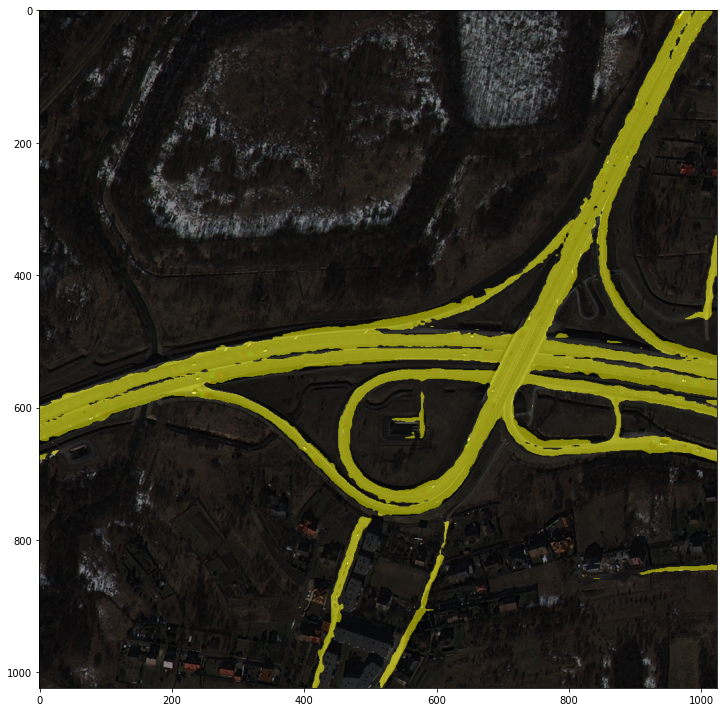

In [ ]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/dice/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/images/up025/OBJ00175_PS3_K3_NIA0081.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/dice/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


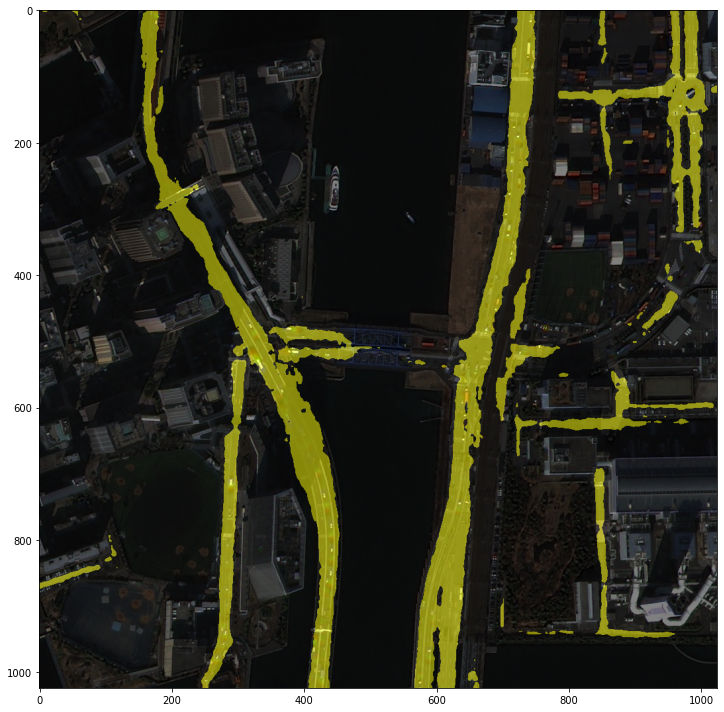

In [ ]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/dice/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/images/up025/OBJ00004_PS3_K3_NIA0078.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/dice/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


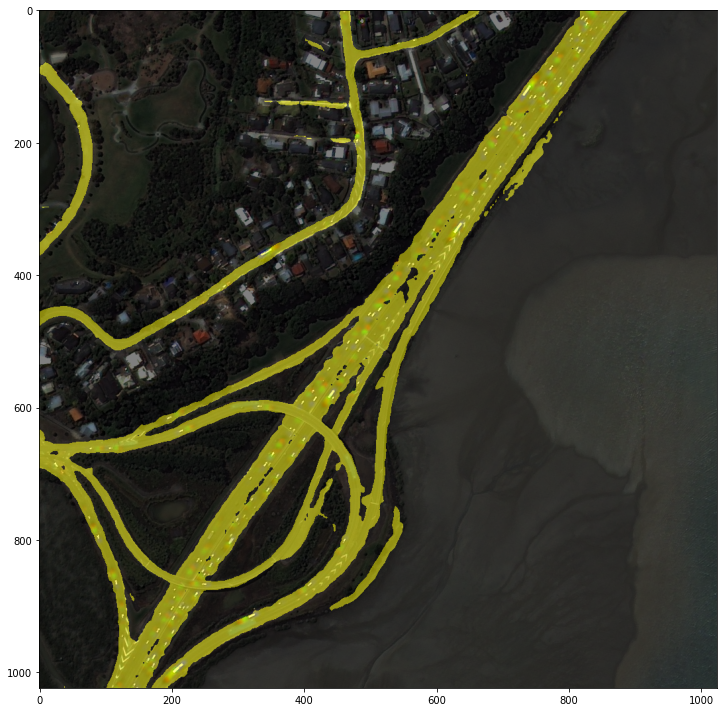

In [ ]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/dice/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/images/up025/OBJ01403_PS3_K3_NIA0093.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/dice/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


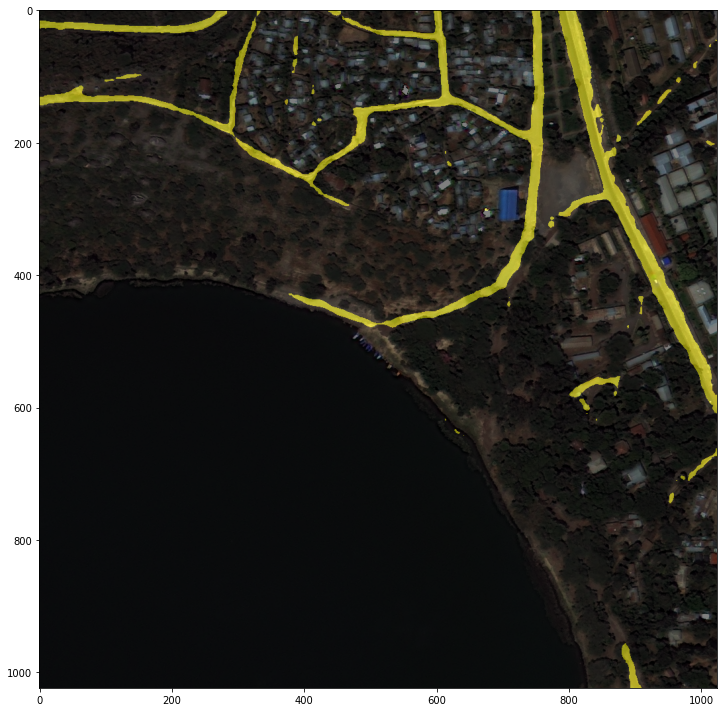

In [ ]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/dice/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/images/up025/OBJ02447_PS3_K3_NIA0122.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/dice/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


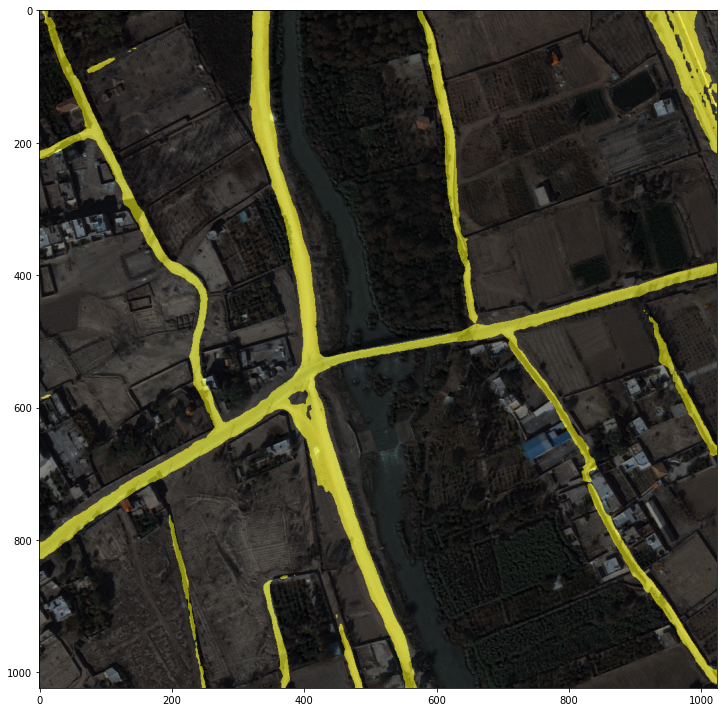

In [ ]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/dice/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/images/up025/OBJ03325_PS3_K3A_NIA0137.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/dice/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


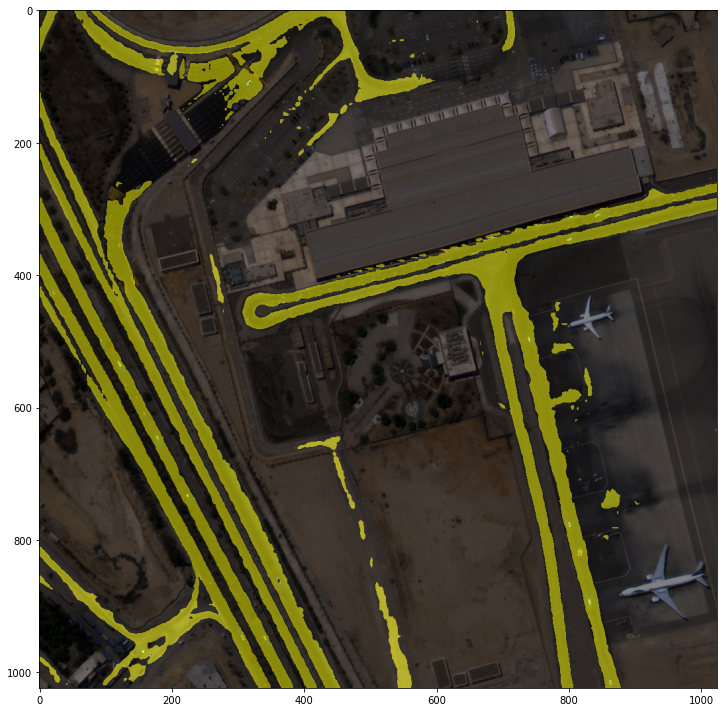

In [ ]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/dice/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/images/up025/BLD00768_PS3_K3A_NIA0277.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/dice/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


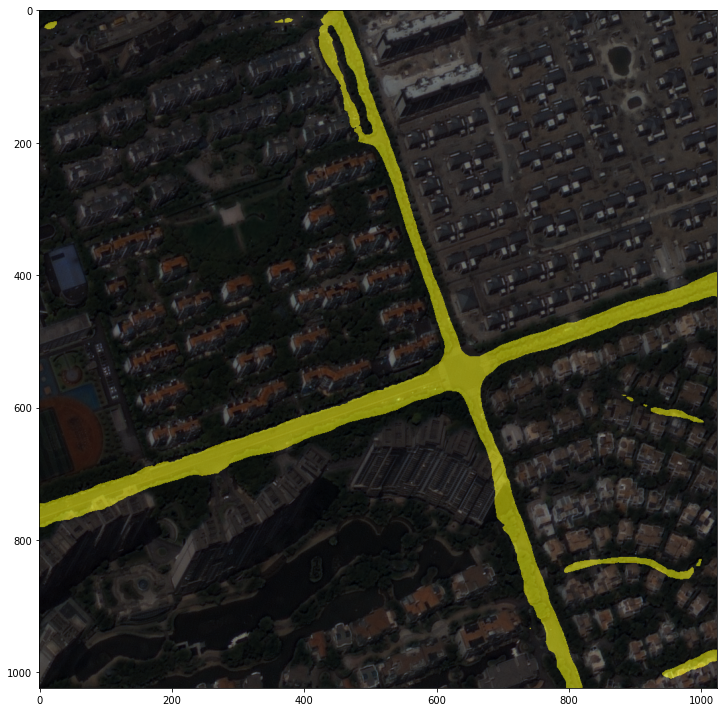

In [ ]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/dice/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/images/up025/BLD01556_PS3_K3A_NIA0373.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/dice/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


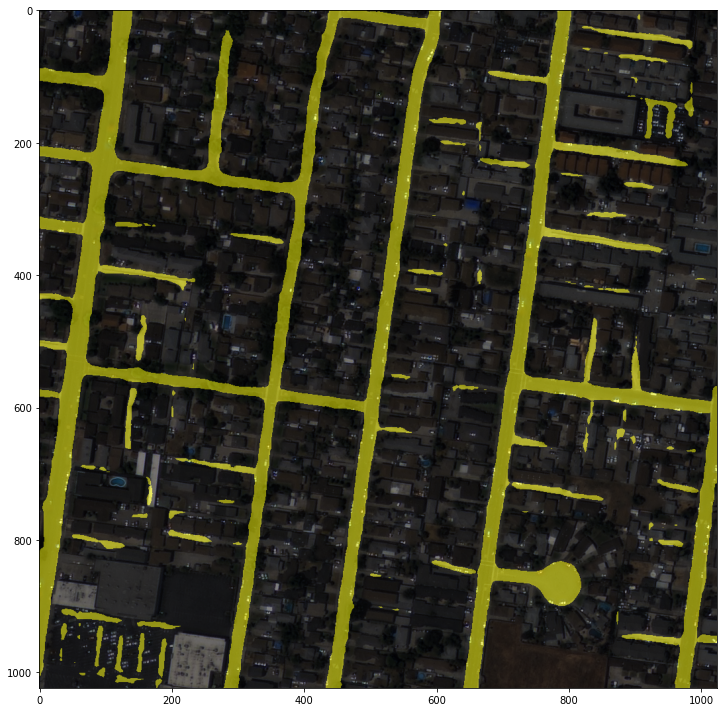

In [ ]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/dice/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/images/up025/BLD11632_PS3_K3A_NIA0390.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/dice/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


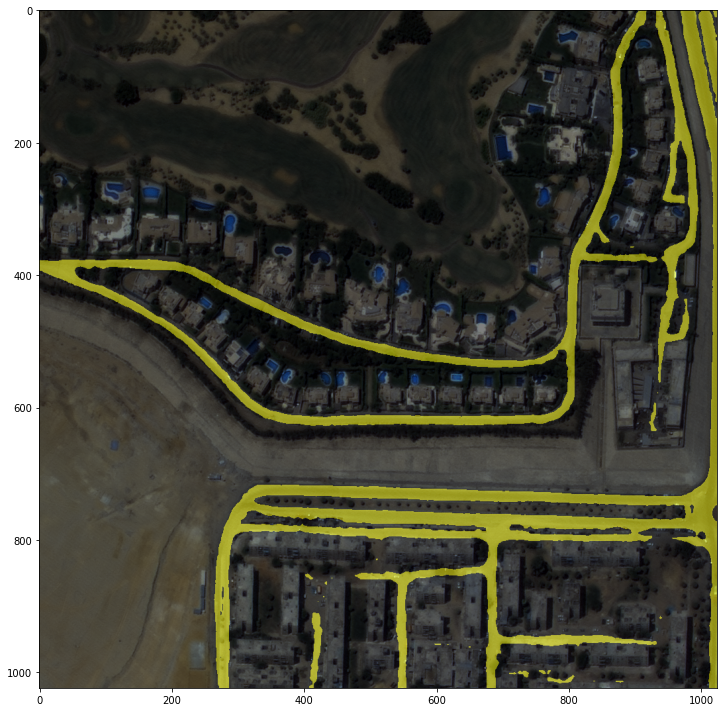

In [ ]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/dice/iter_20000.pth'  #학습된 모델
# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/images/up025/BLD00223_PS3_K3A_NIA0276.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/dice/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


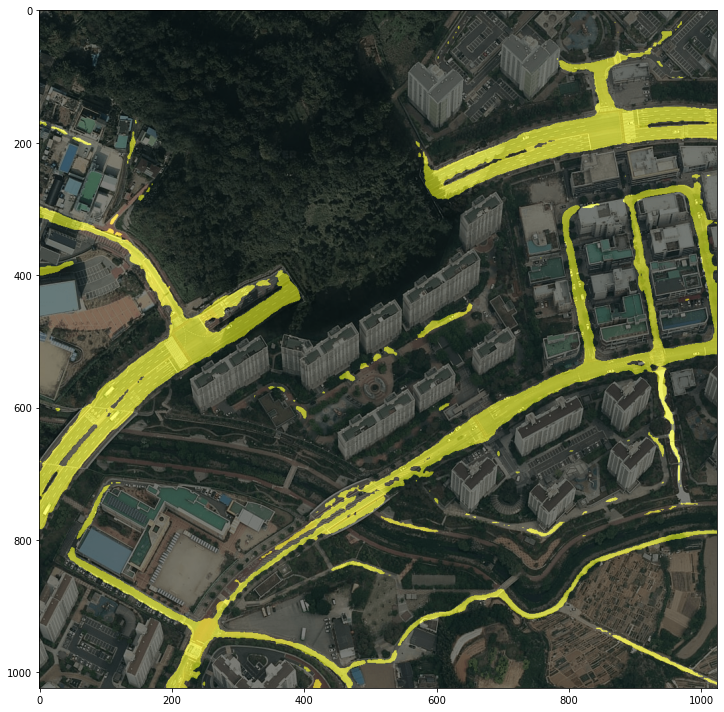

In [ ]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/dice/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/naver_map_images/0000.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/dice/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


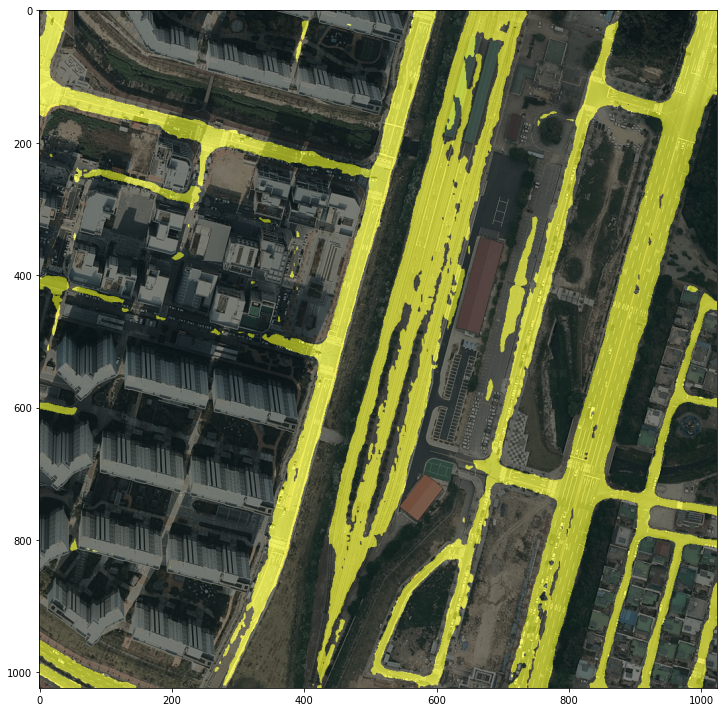

In [ ]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/dice/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/naver_map_images/0001.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/dice/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


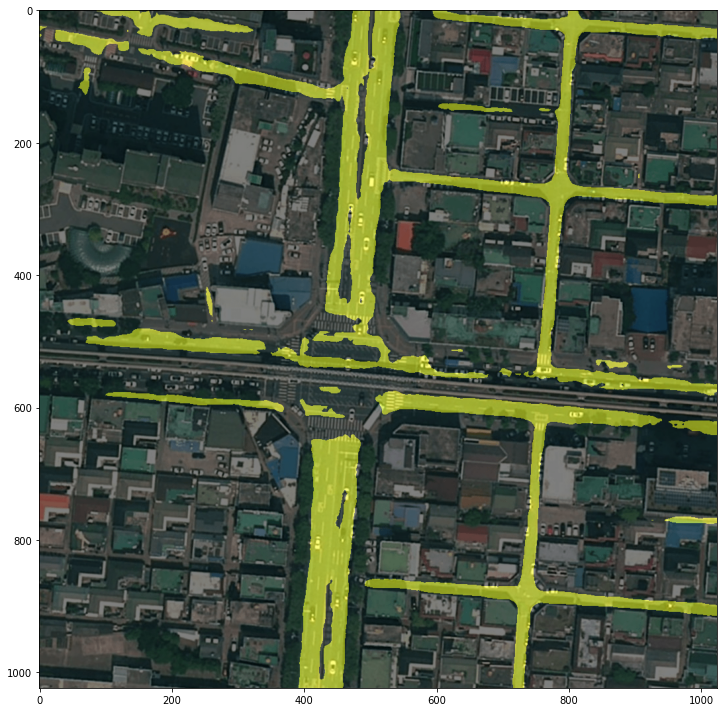

In [ ]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/dice/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/naver_map_images/0002.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)